In [2]:
here::i_am("atac/archR/processing/save_atac_matrices.R")

source(here::here("settings.R"))
source(here::here("utils.R"))

suppressPackageStartupMessages(library(ArchR))

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/10_Eomes_invitro_gut/code



In [3]:
# START TEST ##b
args <- list()
args$archr_directory <- file.path(io$basedir,"processed/atac/archR")
args$metadata <- file.path(io$basedir,"results/atac/archR/qc/sample_metadata_after_qc.txt.gz")
args$matrix <- "GeneScoreMatrix_TSS"
args$outfile <- file.path(io$basedir,sprintf("processed/atac/archR/Matrices/%s_summarized_experiment.rds",args$matrix))
# END TEST ##

In [196]:
chromVAR = readRDS(file.path(io$basedir,"results/atac/archR/chromvar/cells/chromVAR_deviations_CISBP_archr.rds"))

In [95]:
chromVAR

class: SummarizedExperiment 
dim: 884 46547 
metadata(0):
assays(2): deviations z
rownames(884): Tcfap2a_1 Tcfap2b_2 ... Smad5_883 Smad9_884
rowData names(2): idx name
colnames(46547): RBG43473#CCAGGATGTCAGGCAT-1
  RBG43473#AAACATGCATCAGCAC-1 ... RBG43478#AAGCTAGAGGAACCAA-1
  RBG43478#GTGCTGATCTGTTCAT-1
colData names(38): BlacklistRatio nDiFrags ... ReadsInPeaks FRIP

In [211]:
head(fread(file.path(io$basedir,'results/rna/qc/sample_metadata_after_qc.txt.gz')))

cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,alias,day,genotype,pass_rnaQC
<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>
RBG43471#AAACAGCCAACACTTG-1,AAACAGCCAACACTTG-1,RBG43471,3776,10001,17.23,6.23,D2.5_WT_rep1,D2.5,WT,TRUE
RBG43471#AAACAGCCACATACTG-1,AAACAGCCACATACTG-1,RBG43471,3129,7227,15.65,6.03,D2.5_WT_rep1,D2.5,WT,TRUE
RBG43471#AAACAGCCACGAATTT-1,AAACAGCCACGAATTT-1,RBG43471,3791,11338,22.12,8.18,D2.5_WT_rep1,D2.5,WT,TRUE
RBG43471#AAACAGCCAGCATGAG-1,AAACAGCCAGCATGAG-1,RBG43471,5744,23603,19.00,7.44,D2.5_WT_rep1,D2.5,WT,TRUE
RBG43471#AAACAGCCAGTTAGCC-1,AAACAGCCAGTTAGCC-1,RBG43471,2559,6358,24.55,7.80,D2.5_WT_rep1,D2.5,WT,TRUE
RBG43471#AAACAGCCATCACTTC-1,AAACAGCCATCACTTC-1,RBG43471,3908,13167,15.99,5.05,D2.5_WT_rep1,D2.5,WT,TRUE


In [99]:
umap = fread(file.path(io$basedir,"results/atac/archR/dimensionality_reduction/cells/PeakMatrix_atlas/remove_ExE_cells_FALSE/batch_correction_sample/umap_nfeatures35000_dims35_nneighbour25_mindist0.5.txt.gz"))

In [194]:
umap = fread(file.path(io$basedir,"results/rna/dimensionality_reduction/sce/batch_correction_sample/umap_features2500_pcs50_neigh25_dist0.5.txt.gz"))

In [206]:
umap = umap[cell %in% colnames(chromVAR)] %>% setnames(c('umap1', 'umap2', 'cell'))

In [198]:
chromVAR = chromVAR[,umap$cell]

In [199]:
rownames(chromVAR) =  strsplit(rownames(chromVAR), '_') %>% map(1)

In [200]:
chromVAR.mtx = chromVAR@assays@data$z

In [201]:
summary(umap$cell == colnames(chromVAR))

   Mode    TRUE 
logical   46547 

In [202]:
TF = 'Sox17'
thr = 4

In [207]:
plot_chromvar = function(TFi, thri=4){
    if(TFi %in% rownames(chromVAR)){
        values = scale(t(as.matrix(chromVAR[TFi]@assays@data$z)))[,1]
        values = ifelse(values<=-thri, -thri, ifelse(values>=thri, thri, values))
        ggplot(umap, aes(umap1, umap2, col=values)) +
            geom_point() + 
            scale_color_gradient2(low='blue', mid='white', high='red', name=TFi) + 
            theme_void()
    }
}

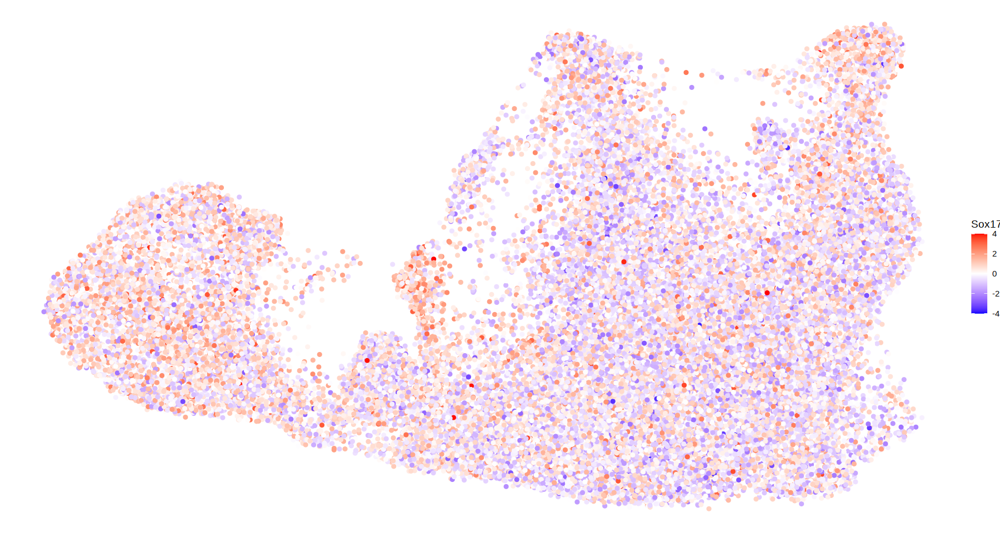

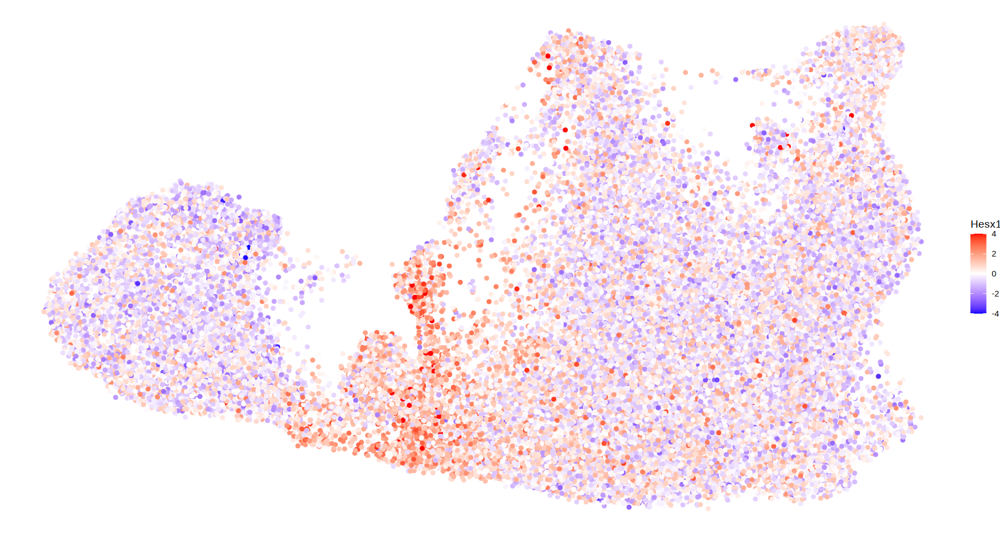

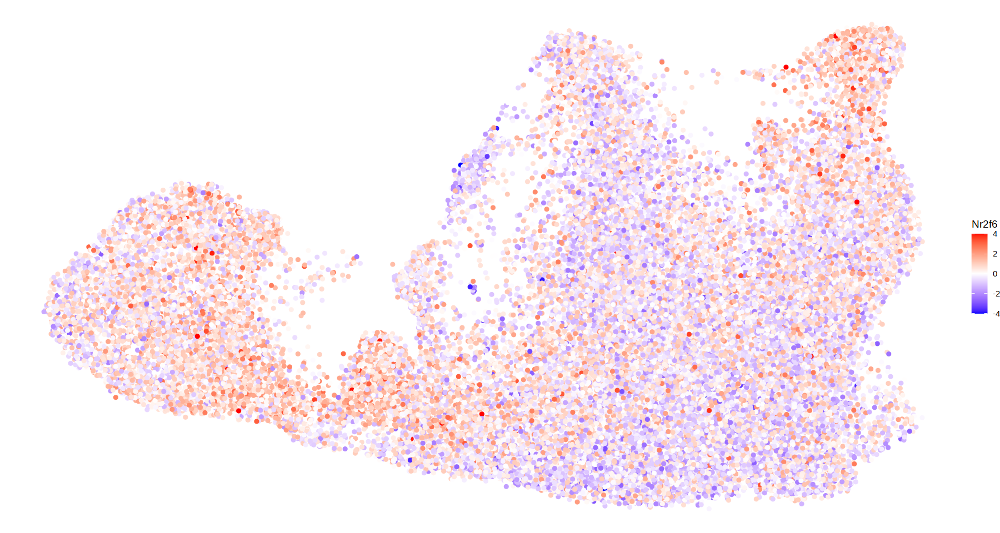

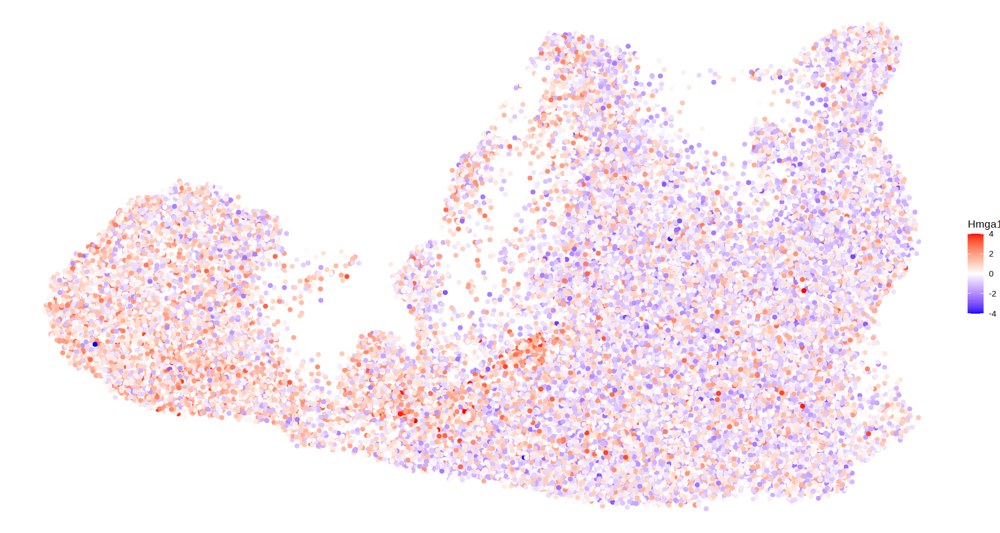

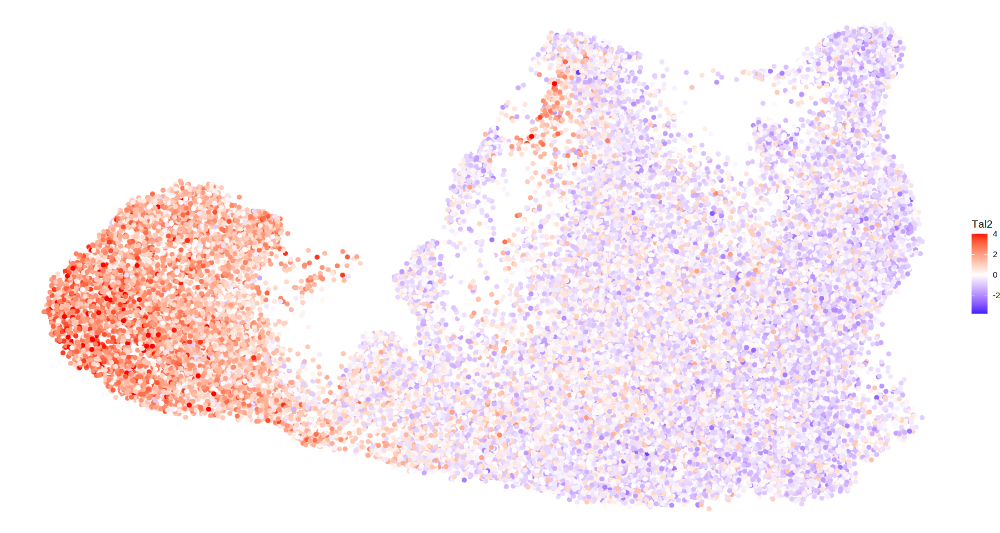

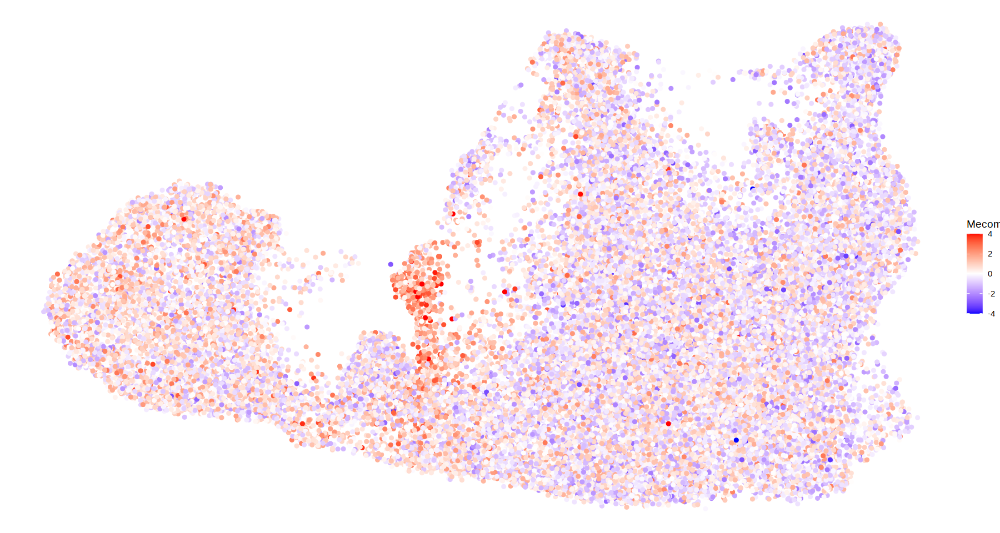

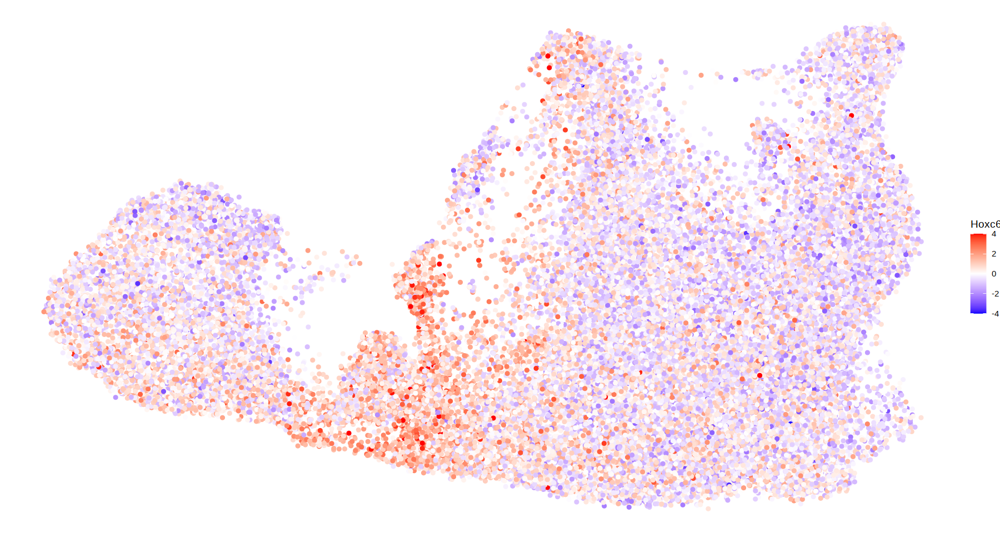

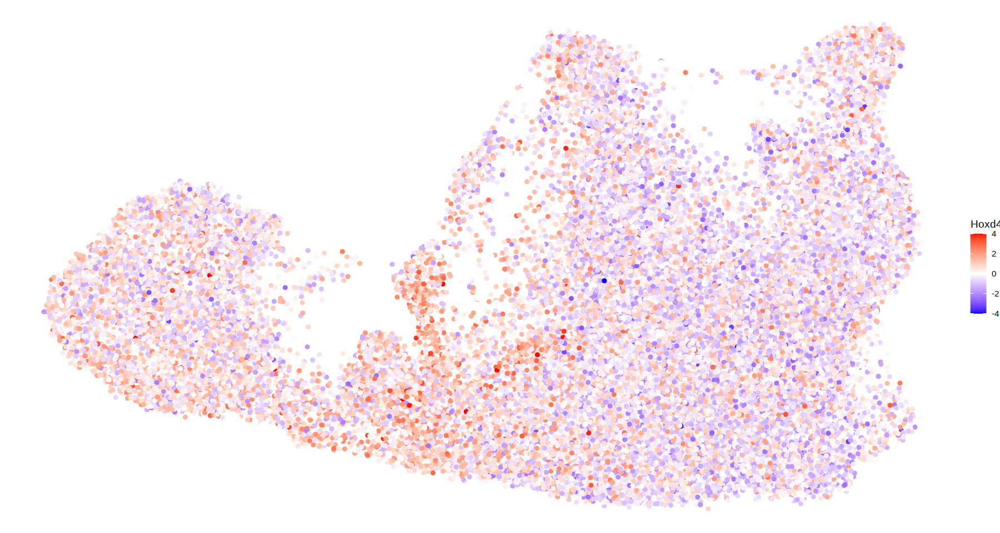

In [208]:
plot_chromvar('Sox17')
plot_chromvar('Hesx1')
plot_chromvar('Nr2f6')
plot_chromvar('Hmga1')
plot_chromvar('Sall4')
plot_chromvar('Tal2')
plot_chromvar('Mecom')
plot_chromvar('Hoxc6')
plot_chromvar('Hoxd4')


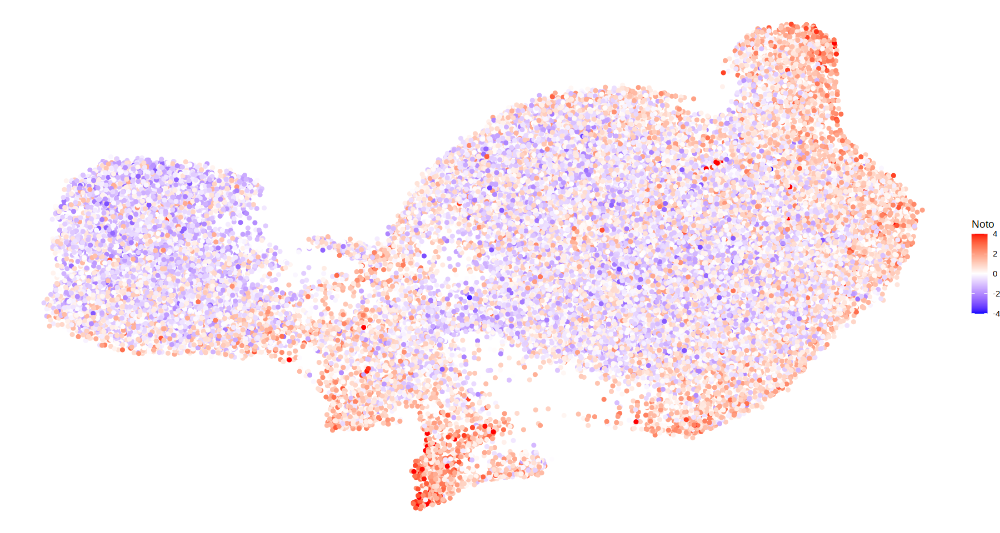

In [186]:
plot_chromvar('Noto')
plot_chromvar('Chrd')


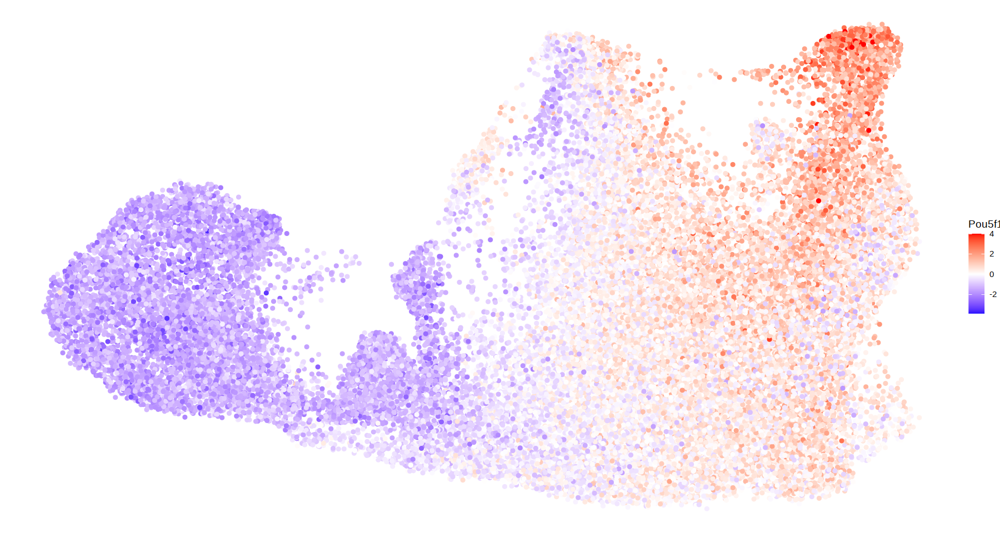

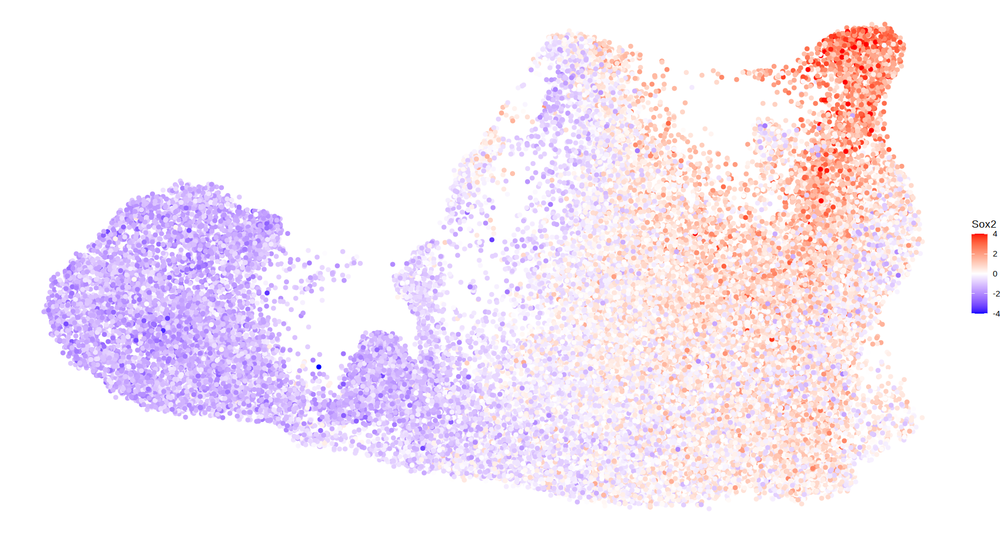

In [209]:
plot_chromvar('Pou5f1')
plot_chromvar('Sox2')
plot_chromvar('Oct4')


In [193]:
plot_chromvar('Blimp1')
plot_chromvar('Prdm14')
plot_chromvar('Tfap2c')